In [ ]:
#Importing all the required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from skimage.util import random_noise

In [ ]:
#Mount GDrive for reading images stored in GDrive

from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
# Get image names from a GDrive directory

import os

path = '/content/gdrive/MyDrive/BSDS300/images/train'

imageNames = []

for i in os.scandir(path):
  imageNames.append(i.path)
#imageNames

uint8
(321, 481, 3)


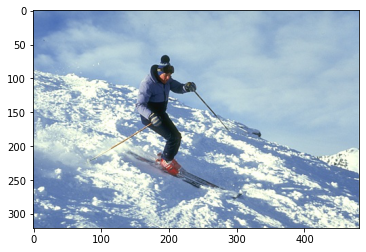

In [ ]:
# Read one image and display it

import matplotlib.pyplot as plt
from matplotlib import image

imageNum = 10 # Eleventh image in the directory will be read

img = image.imread(imageNames[imageNum]) # Read image
# Print image attributes
print(img.dtype)
print(img.shape)

# Display image
plt.imshow(img)
plt.show()

## **Calculating the Total Images of Resolution 321x481 and 481x321 pixels respectively**

In [ ]:
#Counter variables used for counting the no. of images belonging to the different resolution categories

count_321 = 0
count_481 = 0

#Iterate over the container imageNames containing all the 200 Images Locations
for i in range(0,len(imageNames)):
  img = image.imread(imageNames[i])
  
  if img.shape[0] == 321:
    count_321 = count_321 + 1
  
  elif img.shape[0] == 481:
    count_481 = count_481 + 1
  del img
print('The number of images with dimensions 321x481 and 481x321 are {D1} and {D2} respectively'.format(D1 = count_321, D2 = count_481))

The number of images with dimensions 321x481 and 481x321 are 137 and 63 respectively


## **Blurring and adding noise to input images using different noise models and gaussian kernels**

In [ ]:
import random

imgset_321_deg = np.empty((count_321,321,481,3), dtype=float) # Array storing the degraded images of size 321x481
imgset_481_deg = np.empty((count_481,481,321,3), dtype=float) # Array storing the degraded images of size 481x321
imgset_321_og = np.empty((count_321,321,481,3), dtype=float) # Array storing the original images of size 321x481
imgset_481_og = np.empty((count_481,481,321,3), dtype=float) # Array storing the original images of size 481x321

#Index Variables for counting the no. of two different resolution images
j = 0
k = 0

#Loop used to degrade the input images

for i in range(0,len(imageNames)):
  
  Noise_type = ['gaussian','poisson','s&p','speckle'] #List containing different types of noise models
  rand_noise = random.choice(Noise_type) #Choosing a random element from the noise list
  Filter_Size = [3,5,7] #List Containing different filter sizes
  rand_size = random.choice(Filter_Size) #Choosing a random filter size from the list
  img = image.imread(imageNames[i])
  
  if img.shape[0] == 321:
    
    imgset_321_og[j,:,:,:] = img/255.0 #Converting the RGB integer values to float values for operations
    blur_img = cv2.GaussianBlur(img/255.0, (rand_size,rand_size), 0)
    noisy_blur_img = random_noise(blur_img, mode=rand_noise , seed=None, clip=True)
    imgset_321_deg[j,:,:,:] = noisy_blur_img
    j = j + 1
  
  else:
    
    imgset_481_og[k,:,:,:] = img/255.0
    blur_img = cv2.GaussianBlur(img/255.0, (rand_size,rand_size),0)
    noisy_blur_img = random_noise(blur_img, mode=rand_noise , seed=None, clip=True)
    imgset_481_deg[k,:,:,:] = noisy_blur_img
    k = k + 1
  del img

## **Displaying the Degraded image with Original Image**

(-0.5, 320.5, 480.5, -0.5)

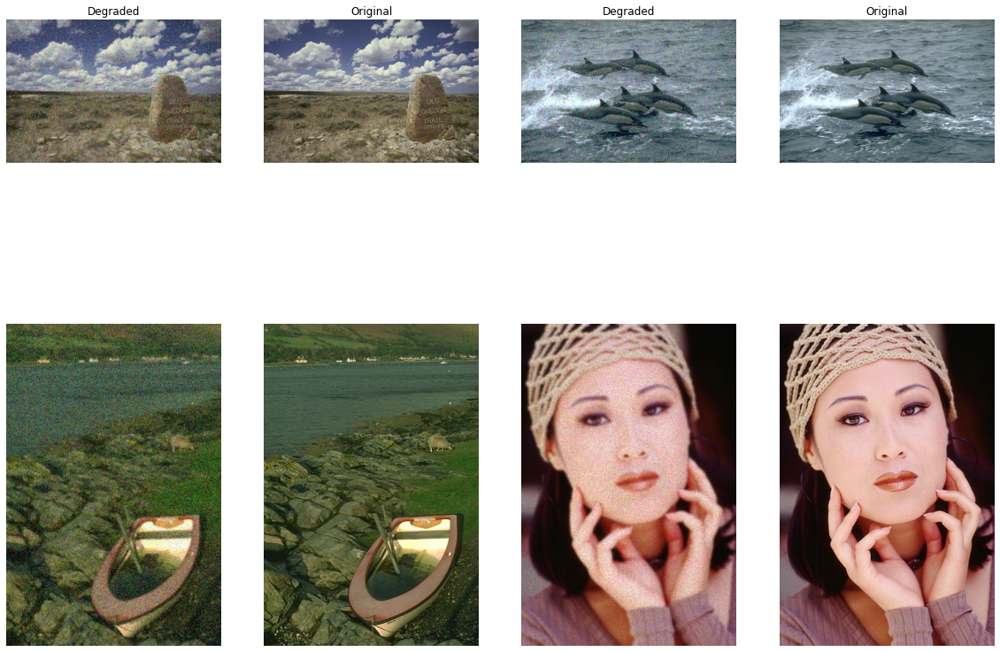

In [ ]:
# create figure
fig = plt.figure(figsize=(20, 15))

# setting values to rows and column variables
rows = 2
columns = 4

# Adds a subplot at the 1st position
fig.add_subplot(rows, columns, 1)
  
# showing image
plt.imshow(imgset_321_deg[130])
plt.axis('off')
plt.title("Degraded")
  
# Adds a subplot at the 2nd position
fig.add_subplot(rows, columns, 2)
  
# showing image
plt.imshow(imgset_321_og[130])
plt.axis('off')
plt.title("Original")

# Adds a subplot at the 3rd position
fig.add_subplot(rows, columns, 3)
  
# showing image
plt.imshow(imgset_321_deg[135])
plt.axis('off')
plt.title("Degraded")
  
# Adds a subplot at the 4th position
fig.add_subplot(rows, columns, 4)
  
# showing image
plt.imshow(imgset_321_og[135])
plt.axis('off')
plt.title("Original")

# Adds a subplot at the 5th position
fig.add_subplot(rows, columns, 5)
  
# showing image
plt.imshow(imgset_481_deg[25])
plt.axis('off')
#plt.title("Degraded")
  
# Adds a subplot at the 6th position
fig.add_subplot(rows, columns, 6)
  
# showing image
plt.imshow(imgset_481_og[25])
plt.axis('off')
#plt.title("Original")

# Adds a subplot at the 7th position
fig.add_subplot(rows, columns, 7)
  
# showing image
plt.imshow(imgset_481_deg[36])
plt.axis('off')
#plt.title("Degraded")

# Adds a subplot at the 8th position
fig.add_subplot(rows, columns, 8)
  
# showing image
plt.imshow(imgset_481_og[36])
plt.axis('off')
#plt.title("Original")

## **Generating Image Patches of Size WxW**

## **Initialization of image container arrays**


In [ ]:
# Get image patches

W = 63 # Patch max window size

num_patch = 50 #Number of patches extracted per image
numPatches_321 = count_321*num_patch  #Total number of patches to be extracted from the images of dimension 321x481
numPatches_481 = count_481*num_patch  #Total number of patches to be extracted from the images of dimension 481x321
og_central_pixel_321 = numPatches_321 #Total number of central pixel values corresponding to the extracted patches of image dimension 321x481
og_central_pixel_481 = numPatches_481 #Total number of central pixel values corresponding to the extracted patches of image dimension 481x321

patches_321 = np.empty((numPatches_321,W,W,3), dtype=float)      #Initializing patch arrays for the images of dimension 321x481
patches_481 = np.empty((numPatches_481,W,W,3), dtype=float)      #Initializing patch arrays for the images of dimension 481x321
og_central_pixel_321 = np.empty((numPatches_321,3), dtype=float) #Initializing array for storing central pixel corresponding to the 321x481 image patch
og_central_pixel_481 = np.empty((numPatches_481,3), dtype=float) #Initializing array for storing central pixel corresponding to the 481x321 image patch

# **Extraction of the patches from the train images**

In [ ]:
for k in range(0,count_321):

  for i in range(num_patch): # For number of patches
    x = random.randint(0, imgset_321_deg[k].shape[0]-W+1) # Random x location so that the patch 
                                            # remains within image boundaries
    y = random.randint(0, imgset_321_deg[k].shape[1]-W+1) # Random y location
                                                          # remains within image boundaries
    
    if imgset_321_deg[k][x:x+W,y:y+W,:].shape[0] == 63 and imgset_321_deg[k][x:x+W,y:y+W,:].shape[1] == 63:
      
      patches_321[num_patch*k + i,:,:,:] = imgset_321_deg[k][x:x+W,y:y+W,:] # Extract patch
      og_central_pixel_321[num_patch*k + i,:] = imgset_321_og[k][int(x + (W-1)/2), int(y + (W-1)/2),:]

In [ ]:
for k in range(0,count_481):

  for i in range(num_patch): # For number of patches
    x = random.randint(0, imgset_481_deg[k].shape[0]-W+1) # Random x location so that the patch 
                                            # remains within image boundaries
    y = random.randint(0, imgset_481_deg[k].shape[1]-W+1) # Random y location
                                                          # remains within image boundaries
    
    if imgset_481_deg[k][x:x+W,y:y+W,:].shape[0] == 63 and imgset_481_deg[k][x:x+W,y:y+W,:].shape[1] == 63:
      
      patches_481[num_patch*k + i,:,:,:] = imgset_481_deg[k][x:x+W,y:y+W,:] # Extract patch
      og_central_pixel_481[num_patch*k + i,:] = imgset_481_og[k][int(x + (W-1)/2), int(y + (W-1)/2),:]

# **Saving the modified images on the mounted google drive**

In [ ]:
import tempfile
from tqdm import tqdm
image_path1 = '/content/gdrive/MyDrive/BSDS300/images/train_new'
image_path2 = '/content/gdrive/MyDrive/BSDS300/images/train_new_noise'

for i in tqdm(range(count_321)):
  temp = cv2.cvtColor((imgset_321_og[i]*255).astype(np.uint8), cv2.COLOR_RGB2BGR)
  cv2.imwrite(image_path1 + '/Img' + str(i) + ".jpg", temp)
  temp = cv2.cvtColor((imgset_321_deg[i]*255).astype(np.uint8), cv2.COLOR_RGB2BGR)
  cv2.imwrite(image_path2+ '/Img' + str(i) + ".jpg", temp)
for j in tqdm(range(count_481)):
  temp = cv2.cvtColor((imgset_481_og[j]*255).astype(np.uint8), cv2.COLOR_RGB2BGR)
  cv2.imwrite(image_path1 + '/Img' + str(count_321 + j) + ".jpg", temp)
  temp = cv2.cvtColor((imgset_481_deg[j]*255).astype(np.uint8), cv2.COLOR_RGB2BGR)
  cv2.imwrite(image_path2+ '/Img' + str(count_321 + j) + ".jpg", temp)

100%|██████████| 63/63 [00:02<00:00, 25.41it/s]


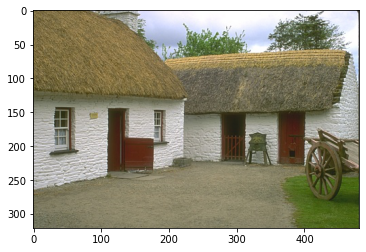

In [ ]:
plt.imshow(imgset_321_og[36])

#**Creation and Model Building using Keras Tensorflow** 


 

*   After trying to build linear regression as well as SVR models, which were too cumbersome, i decided to shift to image input image output mapping using CNN. 
*   The training process which included training for each individual channel for single patches and then stitching them together also was quite rigorous and i faced issues in aligning them together pixelwise.

*  After discussing with the prof in the tutorial session, image to image mapping was also given a green signal.





In [ ]:
# importing cv2 
import cv2
from google.colab.patches import cv2_imshow
import os
import numpy as np
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, Dropout, BatchNormalization, Input
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
# Pre-Process the input data for the model
def float_convert(path):
    img = cv2.imread(path)
    img = cv2.resize(img, (150, 150), interpolation = cv2.INTER_CUBIC)
    img = img/255.0
    return img

Resizing and normalizing the values for float operations.

In [ ]:
# Load the input data from it's path

train_path_noise = '/content/gdrive/MyDrive/BSDS300/images/train_new_noise' #Input
train_path_clean = '/content/gdrive/MyDrive/BSDS300/images/train_new' #Output
test_path = '/content/gdrive/MyDrive/BSDS300/images/test_noise' #Test input data

train_noised = []

for i in sorted(os.listdir(train_path_noise)):
  train_noised.append(float_convert(train_path_noise+'/'+i))

train_clean = []

for i in sorted(os.listdir(train_path_clean)):
  train_clean.append(float_convert(train_path_clean +'/' + i))

test = []

for i in sorted(os.listdir(test_path)):
  test.append(float_convert(test_path+'/'+i))

test_noise => It is the training input that will be used to train the CNN model

test_clean => It is the original output for the respective input used for training

test => The final testing input 

In [ ]:
# convert list to numpy array
X_train = np.asarray(train_noised)
Y_train = np.asarray(train_clean)
X_test = np.asarray(test)

X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size=0.15, random_state = 69)

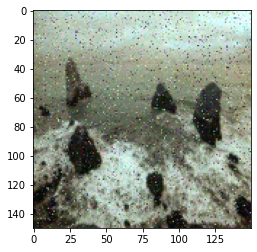

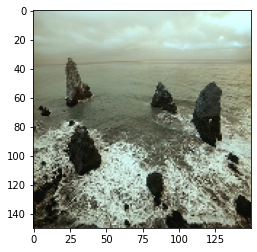

In [ ]:
plt.imshow(X_train[1])
plt.show()
plt.imshow(Y_train[1])
plt.show()

In [ ]:
def model():
    input_layer = Input(shape=(150, 150, 3))
    # Encoder
    x = layers.Conv2D(32, (3, 3), activation="relu", padding="same")(input_layer)
    #x = layers.MaxPooling2D((2, 2), padding="same")(x)
    x = layers.Conv2D(32, (3, 3), activation="relu", padding="same")(x)
    x = layers.Conv2D(32, (5, 5), activation="relu", padding="same")(x)
    x = layers.MaxPooling2D((2, 2), padding="same")(x)
    x = layers.UpSampling2D((2, 2))(x)
    # Decoder
    x = layers.Conv2D(32, (5, 5), activation="relu", padding="same")(x)
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    #x = layers.UpSampling2D((2, 2))(x)

    output_layer = layers.Conv2D(3, (3, 3), activation="sigmoid", padding="same")(x)
    
    model = Model(inputs=[input_layer], outputs=[output_layer])
    
    optimizer = keras.optimizers.Adam(learning_rate=0.001) # changed from 0.001 for 2nd run
    model.compile(optimizer=optimizer , loss='mean_squared_error', metrics=['mse'])

    return model


model = model()
model.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 150, 150, 3)]     0         
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 150, 150, 32)      896       
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 150, 150, 32)      9248      
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 150, 150, 32)      25632     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 75, 75, 32)        0         
_________________________________________________________________
up_sampling2d_3 (UpSampling2 (None, 150, 150, 32)      0         
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 150, 150, 32)      2563

In [ ]:
def scheduler(epoch, lr):

  # time-based decay
  decay = 0.001/500
  return lr * 1/(1 + decay*epoch)

#callback1 = EarlyStopping(monitor='loss', patience=10)
#callback2 = keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=0.0001)
callback3 = keras.callbacks.LearningRateScheduler(scheduler, 1)

history = model.fit(X_train, Y_train, validation_data = (X_val, Y_val), epochs=1000, batch_size=8, verbose=1, callbacks=[callback3])

1.   The learning rate was varied from 1e-5 to 1e-3 in steps manually.
2.   The higher value of learning rate didn't produce a saturated output mse value since the optimum minimum point was not achieved.
3. With a value of 1e-3, it yielded MSE which was significantly lower than the previous other values  
4. Learning rate scheduler was then used in order to produce, a decaying learning rate which changed after the epochs


In [ ]:
!mkdir "/content/gdrive/MyDrive/EE610"

In [ ]:
# %cd "/content/gdrive/MyDrive/EE610"
# model.save("model_final")
from tensorflow import keras
model = keras.models.load_model('model_final')

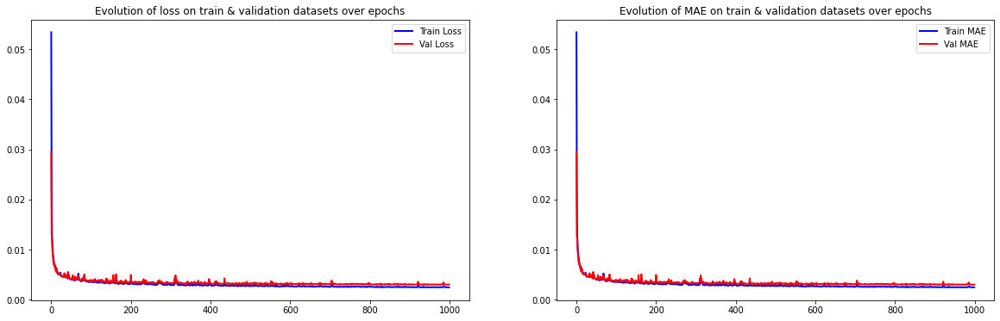

In [ ]:
# Relationship between loss and MSE is shown below
epoch_loss = history.history['loss']
epoch_val_loss = history.history['val_loss']
epoch_mae = history.history['mse']
epoch_val_mae = history.history['val_mse']

plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
plt.plot(range(0,len(epoch_loss)), epoch_loss, 'b-', linewidth=2, label='Train Loss')
plt.plot(range(0,len(epoch_val_loss)), epoch_val_loss, 'r-', linewidth=2, label='Val Loss')
plt.title('Evolution of loss on train & validation datasets over epochs')
plt.legend(loc='best')

plt.subplot(1,2,2)
plt.plot(range(0,len(epoch_mae)), epoch_mae, 'b-', linewidth=2, label='Train MAE')
plt.plot(range(0,len(epoch_val_mae)), epoch_val_mae, 'r-', linewidth=2,label='Val MAE')
plt.title('Evolution of MAE on train & validation datasets over epochs')
plt.legend(loc='best')

plt.show()

1. From the above curves, it can be clearly seen that the Validation Loss followed the train loss but didn't exactly overlap.
2. The no. of epochs were decided so that the model didn't overfit and early stopping criteria was obeyed.

In [ ]:
Y_train[0].shape

(150, 150, 3)

In [ ]:
# predict/clean test images
Y_test = model.predict(X_test, batch_size=16)

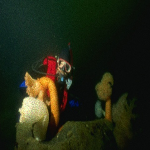

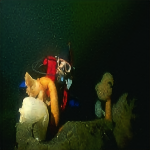

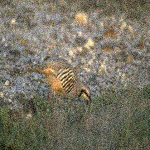

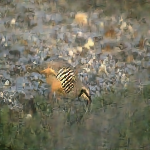

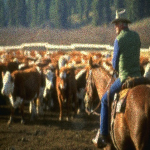

...

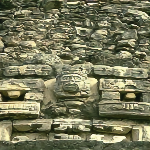

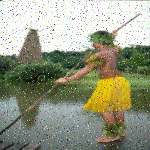

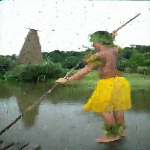

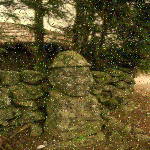

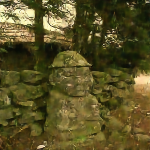

<Figure size 1080x1800 with 0 Axes>

In [ ]:
plt.figure(figsize=(15,25))
for i in range(len(Y_test)):
    cv2_imshow(X_test[i]*255.0)
    
    cv2_imshow(Y_test[i]*255.0)

plt.show()

In [ ]:
# Get image names from a GDrive directory

import os

path = '/content/gdrive/MyDrive/BSDS300/images/test'

imageNames = []

for i in os.scandir(path):
  imageNames.append(i.path)
#imageNames

uint8
(481, 321, 3)


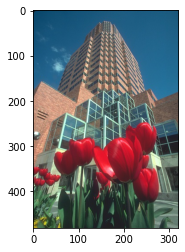

In [ ]:
# Read one image and display it

import matplotlib.pyplot as plt
from matplotlib import image

imageNum = 10 # Eleventh image in the directory will be read

img = image.imread(imageNames[imageNum]) # Read image
# Print image attributes
print(img.dtype)
print(img.shape)

# Display image
plt.imshow(img)
plt.show()

In [ ]:
#Counter variables used for counting the no. of images belonging to the different resolution categories

count_321 = 0
count_481 = 0

#Iterate over the container imageNames containing all the 200 Images Locations
for i in range(0,len(imageNames)):
  img = image.imread(imageNames[i])
  
  if img.shape[0] == 321:
    count_321 = count_321 + 1
  
  elif img.shape[0] == 481:
    count_481 = count_481 + 1
  del img
print('The number of images with dimensions 321x481 and 481x321 are {D1} and {D2} respectively'.format(D1 = count_321, D2 = count_481))

The number of images with dimensions 321x481 and 481x321 are 77 and 23 respectively


In [ ]:
import random

imgset_321_deg = np.empty((count_321,321,481,3), dtype=float) # Array storing the degraded images of size 321x481
imgset_481_deg = np.empty((count_481,481,321,3), dtype=float) # Array storing the degraded images of size 481x321
imgset_321_og = np.empty((count_321,321,481,3), dtype=float) # Array storing the original images of size 321x481
imgset_481_og = np.empty((count_481,481,321,3), dtype=float) # Array storing the original images of size 481x321

#Index Variables for counting the no. of two different resolution images
j = 0
k = 0

#Loop used to degrade the input images

for i in range(0,len(imageNames)):
  
  Noise_type = ['gaussian','poisson','s&p','speckle'] #List containing different types of noise models
  rand_noise = random.choice(Noise_type) #Choosing a random element from the noise list
  Filter_Size = [3,5,7] #List Containing different filter sizes
  rand_size = random.choice(Filter_Size) #Choosing a random filter size from the list
  img = image.imread(imageNames[i])
  
  if img.shape[0] == 321:
    
    imgset_321_og[j,:,:,:] = img/255.0 #Converting the RGB integer values to float values for operations
    blur_img = cv2.GaussianBlur(img/255.0, (rand_size,rand_size), 0)
    noisy_blur_img = random_noise(blur_img, mode=rand_noise , seed=None, clip=True)
    imgset_321_deg[j,:,:,:] = noisy_blur_img
    j = j + 1
  
  else:
    
    imgset_481_og[k,:,:,:] = img/255.0
    blur_img = cv2.GaussianBlur(img/255.0, (rand_size,rand_size),0)
    noisy_blur_img = random_noise(blur_img, mode=rand_noise , seed=None, clip=True)
    imgset_481_deg[k,:,:,:] = noisy_blur_img
    k = k + 1
  del img

In [ ]:
import tempfile
from tqdm import tqdm
image_path2 = '/content/gdrive/MyDrive/BSDS300/images/test_noise'

for i in tqdm(range(count_321)):
  # temp = cv2.cvtColor((imgset_321_og[i]*255).astype(np.uint8), cv2.COLOR_RGB2BGR)
  # cv2.imwrite(image_path1 + '/Img' + str(i) + ".jpg", temp)
  temp = cv2.cvtColor((imgset_321_deg[i]*255).astype(np.uint8), cv2.COLOR_RGB2BGR)
  cv2.imwrite(image_path2+ '/Img' + str(i) + ".jpg", temp)
for j in tqdm(range(count_481)):
  # temp = cv2.cvtColor((imgset_481_og[j]*255).astype(np.uint8), cv2.COLOR_RGB2BGR)
  # cv2.imwrite(image_path1 + '/Img' + str(count_321 + j) + ".jpg", temp)
  temp = cv2.cvtColor((imgset_481_deg[j]*255).astype(np.uint8), cv2.COLOR_RGB2BGR)
  cv2.imwrite(image_path2+ '/Img' + str(count_321 + j) + ".jpg", temp)

100%|██████████| 23/23 [00:00<00:00, 50.00it/s]


#References

1.https://www.geeksforgeeks.org/how-to-display-multiple-images-in-one-figure-correctly-in-matplotlib/ - Displaying Multiple images

2. https://keras.io/examples/vision/autoencoder/ - Adaption of the autoencoder used for denoising, for denoising as well as sharpening

3. https://machinelearningmastery.com/using-learning-rate-schedules-deep-learning-models-python-keras/ - Learning Rate scheduler was used in order to achieve increased learning rate and more accuracy

4. https://stats.stackexchange.com/questions/181/how-to-choose-the-number-of-hidden-layers-and-nodes-in-a-feedforward-neural-netw - Deciding the number of hidden layers of the neural network

5. Discussed about the method with Harsh Pal (18D070012) one of my classmates in the course
